Лабороторная работа №2


В современных задачах обработки изображений, будь то задача обнаружения объектов, задача распознавания образов, задача (семантической) сегментации, задача классификации изображений и другие, всё чаще используют **свёрточные нейросети** (*Convolutional Neural Networks*, *CNN*).

Они показывают очень хорошие результаты, за ними стоит как [математический аппарат](https://stats.stackexchange.com/questions/269854/are-there-mathematical-reasons-for-convolution-in-neural-networks-beyond-expedie), так и эвристики, полученные опытным путём.

В данном задании Вам предстоит познакомиться с архитектурами *AlexNet*, *VGG* и *Inception* и для каждой из этих моделей использовать технику **Transfer Learning**.  

* **Transfer Learning** - это процесс дообучения на **новых данных** какой-либо нейросети, уже обученной до этого на других данных, обычно на каком-нибудь хорошем, большом (миллионы картинок) датасете (например, [ImageNet](http://www.image-net.org/) ~ 14 млн картинок).

<h2 style="text-align: center;"><b>AlexNet</b></h2>

**AlexNet** - нейронная сеть, которая победила в ILSVRC (соревнование по классификации картинок из ImageNet) в 2012 году и стала основой для многих других архитектур. Впервые она была представлена в статье  “ImageNet Classification with Deep Convolutional Neural Networks”, над которой работал Джоффри Хинтон - человек, которого многие называют отцом современного computer vision.

Архитектура описана на картинке ниже

<img src="https://www.learnopencv.com/wp-content/uploads/2018/05/AlexNet-1.png">

**AlexNet** состоит из 5 **сверточных** слоев, 3 **MaxPool** слоев и 2 **FullyConnected** слоев в конце. Обратите внимание, что в последнем пулинг слое окна, из которых берется максимум, пересекаются за счет того, что *stride*=2. Это изменение по сравнению с традиционным пулингом помогло снизить ошибку на 0.4%.



<h2 style="text-align: center;"><b>VGG</b></h3>

Один **сверточный** слой с фильтром 5$\times$5 можно заменить двумя подряд идущими слоями с фильтрами размером 3$\times$3, так как **воспринимаемая область** картинки у них будет одинаковой. При этом уменьшиться количество параметров, поэтому такую сеть будет легче обучать.

На момент создания VGG люди уже заметили, что чем больше слоев в нейросети, тем выше ее точность. Заменяя большие фильтры на несколько фильтров 3$\times$3 исследователи получили глубокую нейросеть с меньшим количеством параметров. Архитектура VGG-16 (версии VGG с 16 слоями) представлена на картинке ниже:


<img src="https://cdn-images-1.medium.com/max/1040/1*0Tk4JclhGOCR_uLe6RKvUQ.png">

Когда говорят **VGG**, то чаще всего имеют ввиду **VGG-16** или **VGG-19**. Более глубоких версий **VGG** нет, так как после 19 слоев точность начинает падать.

Чтобы добиться высоких результатов в соревновании при обучении и валидации нейросети использовались дополнительные премы, подробнее о которых можно прочитать в [статье на Medium](https://medium.com/coinmonks/paper-review-of-vggnet-1st-runner-up-of-ilsvlc-2014-image-classification-d02355543a11).


<h2 style="text-align: center;"><b>Inception v1</b></h3>

### Рассмотрим идею, которая подтолкнула исследователей к созданию этой архитектуры.

Площадь, которую занимает классифицируемый объект, может очень сильно отличаться. Пример на картинке ниже:

<img src="https://cdn-images-1.medium.com/max/1040/1*aBdPBGAeta-_AM4aEyqeTQ.jpeg">

* Для извлечения информации с большой площади лучше всего подходят **большие** фильтры, и наоборот для маленьких объектов лучше **маленькие** фильтры.
* Глубокие нейронные сети намного сложнее обучать: в них появляется проблема **затухания градиента** и они **переобучаются**.
Чтобы решить первую проблему исследователи придумали **Incepton** модуль, который применяет фильтры разного размера и затем склеивает полученные каналы. При этом извлекается как информация из больших объектов, так и из маленьких. Простейшая реализация модуля выглядит так:
<img src="https://cdn-images-1.medium.com/max/1040/1*DKjGRDd_lJeUfVlY50ojOA.png">

Реализацию можно сделать более эффективной, если сначала уменьшить количество каналов с помощью **сверточного слоя** 1$\times$1 и лишь затем применить **слой** с фильтрами 5$\times$5. Сокращение вычислений происходит за счет того, что мы сначала **уменьшаем размерность** данных и лишь затем преобразовываем их. Продвинутая реализация:
<img src="https://cdn-images-1.medium.com/max/1040/1*U_McJnp7Fnif-lw9iIC5Bw.png">

Сеть состоит из **корня** (нескольких сверточных слоев) и **Inception** модулей идущих за ним. Оранжевым прямоугольников выделен корень, а фиолетовыми - **вспомогательные классификаторы**. Именно они помогают бороться со второй проблемой, которую мы упомянули ранее. Наша функция потерь - взвешенная сумма **LogLoss** на двух **вспомогательных классификаторах** и **основном** в конце нейронной сети.
<img src="https://cdn-images-1.medium.com/max/1040/1*uW81y16b-ptBDV8SIT1beQ.png">

После Inception v1 были представлены 2, 3 и 4 версии, прочитать о которых вы можете  в [статье на Medium](https://towardsdatascience.com/a-simple-guide-to-the-versions-of-the-inception-network-7fc52b863202).

<h2 style="text-align: center;"><b>Transfer Learning</b></h3>

Теперь мы перейдем к тому, как можно использовать уже обученные нейросети, чтобы ускорить свою работу.

Давайте вспомним общую архитектуру CNN:

<img src="https://ru.wikipedia.org/wiki/%D0%A1%D0%B2%D1%91%D1%80%D1%82%D0%BE%D1%87%D0%BD%D0%B0%D1%8F_%D0%BD%D0%B5%D0%B9%D1%80%D0%BE%D0%BD%D0%BD%D0%B0%D1%8F_%D1%81%D0%B5%D1%82%D1%8C#/media/%D0%A4%D0%B0%D0%B9%D0%BB:%D0%90%D1%80%D1%85%D0%B8%D1%82%D0%B5%D0%BA%D1%82%D1%83%D1%80%D0%B0_%D1%81%D0%B2%D0%B5%D1%80%D1%82%D0%BE%D1%87%D0%BD%D0%BE%D0%B9_%D0%BD%D0%B5%D0%B9%D1%80%D0%BE%D0%BD%D0%BD%D0%BE%D0%B9_%D1%81%D0%B5%D1%82%D0%B8.png">

С помощью операций *свёртки (convolution)* и *пулинга (pooling)* всё, что расположено до этапа *classification*, по сути **извлекает признаки из объектов, подающихся на вход** (картинок, в данном случае). То есть вместо того, чтобы самим пытаться как-то описать картинки для хорошей работы классификатора, мы предоставляем заняться этим нейросети (обучая её методом обратного распространения ошибки.

<h2 style="text-align: center;"><b>Описание метода</b></h3>

Представим теперь, что eсть свой набор данных, и Вы хотите научить сеть классифицировать объекты из Вашей выборки.  
Есть 4 возможных подхода к задаче:

* **1. Написать свою собственную нейронную сеть**
    * Если Вас зовут не Ian Godfellow, Geoffry Hinton или Andrew Ng, то не рекомендуется пользоваться этим способом
    * May the force be with You

* **2. CNN как средство для извлечения признаков (Feature Extractor)**
    * Берём сетку, обученную на ImageNet
    * Убираем последние Fully-Connected слои сети, отвечающие за классификацию. Веса предыдущих слоёв **заморожены**, мы их не трогаем. Теперь сеть выдаёт не метки классов, а то, что поступало на вход Fully-Connected (развёрнутый в строку "параллелепипед" HxWxNUM_FILTERS с последнего слоя перед FC)
    * Запускаем сеть на новом датасете, получаем выходы сети для всех объектов - это и есть их признаки, полученные сетью
    * Обучаем на этих признаках какой-либо классификатор (свою Fully-Connected сеть, например)
    * Теперь у нас есть сеть, работающая хорошо на нашем датасете

* **3. CNN, которую можно дообучить (Fine Tuning)**  
    * Берём сетку, обученную на ImageNet  
    * Убираем последние Fully-Connected слои сети, отвечающие за классификацию.  
    * Теперь всё же *распространяем backpropagation ещё на сколько-то слоёв назад (размораживаем веса в этих слоях)*, чтобы скорректировать их под новые данные. Можно распространить обучение и на всю сеть, но часто первые слои всё же замораживают, поскольку они (как ожидается) извлекают более общие признаки. А ещё обучать всю сеть всё же дольше, чем несколько слоёв. Всё зависит от того, какого качества Вы хотите добиться
    * Теперь сеть выдаёт не метки классов, а то, что поступало на вход Fully-Connected (веса последних (или всех) слоёв были изменены под наши данные)
    * Обучаем на этих признаках какой-либо классификатор (свою Fully-Connected сеть, например)
    * Теперь у нас есть сеть, работающая хорошо на нашем датасете

* **4. Использовать предобученную модель "из коробки"**  
    * То есть взять уже готовую нейронную сеть и использовать её (её параметры (W, b..), ведь сеть характеризуется параметрами, если архитектура известна) для решения своей задачи. Например, [здесь](https://github.com/BVLC/caffe/wiki/Model-Zoo) люди часто выкладывают веса моделей, обученных для решения их специфических задач.  


В зависимости от количества и природы Ваших данных есть выбор из **нескольких стратегий Transfer Learning**, а именно:

* *У Вас **мало данных** ($\le$ 10k), и они **похожи** на данные, на которых была обучена сеть до этого*  
Если данные совсем похожи, можно попробовать использовать готовую модель. Если качество Вас не устраивает, то тогда стоит использовать CNN для извлечения признаков и обучить свой классификатор на этих данных (2-ой способ выше). Так как данные похожи на те, на которых обучалась сеть, то высокоуровневые признаки, полученные с помощью последних слоёв сети, должны оказаться информативными. Если делать в этом случае Fine-Tuning (3 способ), то сеть может переобучиться, поскольку данных мало.
* *У Вас **мало данных** ($\le$ 10k), и они **не похожи** на данные, на которых была обучена сеть до этого*  
Самый невыгодный случай. Здесь мы не можем ожидать от сети, что выходы последних слоёв будут информативными для новых данных. Следует также действовать в соответствие со 2-ым способом, но брать как признаки выходы более ранних слоёв, ведь, как мы помним, они (как ожидается) соответствуют более общим паттернам в данных.
* *У Вас **много данных** ($\ge$ 10k), и они **похожи** на данные, на которых была обучена сеть до этого*  
В этом случае можем смело делать Fine-Tuning (3 способ) (если не устроило качество модели "из коробки"), ведь данных много, и вероятность переобучения меньше. В данном случае имеет смысл попробовать разморохить веса последних нескольких слоёв (зависит от того, сколько у Вас времени и вычислительной мощности, можно разморозить и всю сеть)
* *У Вас **много данных** ($\ge$ 10k), и они **не похожи** на данные, на которых была обучена сеть до этого*
В принципе, подход тот же, что и в случае похожих данных, то есть мы файнтюним практически всю нейросеть. Однако мы вольны в этом случае полнстью менять все параметры (и гиперпараметры) нейросети, ведь по сути мы пользуемся только её архитектурой, забывая о том, что она уже была когда-то обучена. Но часто веса предобученной сети оставляют в качестве инициализации для обучения на новых данных.

Надеемся, что теперь Вам стало понятнее, как обучать крутые сети на новых данных.

<h2 style="text-align: center;"><b>Лабораторная работа №2</b></h3>

<p style="text-align: center;"><i>(основано на http://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html)</i></p>

Мы будем пользоваться библиотекой PyTorch. Если Вы её ещё не установили, то вот [инструкция на Wiki по установке PyTorch](https://github.com/deepmipt/dlschl/wiki/%D0%98%D0%BD%D1%81%D1%82%D1%80%D1%83%D0%BA%D1%86%D0%B8%D1%8F-%D0%BF%D0%BE-%D1%83%D1%81%D1%82%D0%B0%D0%BD%D0%BE%D0%B2%D0%BA%D0%B5-PyTorch).

In [ ]:
#!pip install torch torchvision

In [ ]:
from __future__ import print_function, division

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler

import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os

plt.ion()

### В чём состоит задание

Вам предстоит попробовать использовать  типа архитектур свёрточных нейросетей - **AlexNet (сделано за Вас в примере), VGG16, Inception_v3** - как *Feature Extractor*, с помощью *Fine Tuning* и *"из коробки"*.

**Для каждого пункта нужно:**
- вывести график loss'а на обучающей и на валидационной выборке
- вывести качество модели (accuracy)

### Данные  

В данном задании используются сети (из библиотеки **torchvision**), предобученные на датасете ImageNet.  
В качестве новых данных будет датасет Меравьи vs Пчёлы, Вам нужно скачать его отсюда: **[Муравьи vs Пчёлы](https://download.pytorch.org/tutorial/hymenoptera_data.zip)**, *являющийся частью датасета ImageNet*. В нём 400 картинок, ~250 обучение и ~150 валидация (тест).

### Функции для отрисовки и обучения модели:

In [ ]:
def plot_losses(losses, title="Training and Validation Loss"):
    """
    Функция для отрисовки графика потерь
    """
    plt.figure(figsize=(10, 6))
    plt.plot(losses['train'], label='Training Loss', color='blue')
    plt.plot(losses['val'], label='Validation Loss', color='red')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_accuracies(accuracies, title="Training and Validation Accuracy"):
    """
    Функция для отрисовки графика точности
    """
    plt.figure(figsize=(10, 6))
    plt.plot(accuracies['train'], label='Training Accuracy', color='blue')
    plt.plot(accuracies['val'], label='Validation Accuracy', color='red')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


* Загрузим данные:

In [ ]:
# Преобразование обучающих данных для расширения обучающей выборки и её нормализация
# Для валидационной (тестовой) выборки только нормализация
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

# Скачиваем данные, если их нет
import urllib.request
import zipfile

data_dir = "hymenoptera_data"
if not os.path.exists(data_dir):
    print("Скачиваем датасет...")
    urllib.request.urlretrieve("https://download.pytorch.org/tutorial/hymenoptera_data.zip", "hymenoptera_data.zip")
    with zipfile.ZipFile("hymenoptera_data.zip", 'r') as zip_ref:
        zip_ref.extractall(".")
    print("Датасет скачан и распакован")

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
# специальный класс для загрузки данных в виде батчей
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4,
                                              shuffle=True, num_workers=0)  # поставим 0 для macOS
               for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

use_gpu = torch.cuda.is_available()
print(f"GPU доступен: {use_gpu}")
print(f"Классы: {class_names}")
print(f"Размеры датасета: {dataset_sizes}")

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/hymenoptera_data/train'

Размеры обучающей и валидационной выборок:

In [ ]:
print(dataset_sizes)

{'train': 244, 'val': 153}


* Посмотрим на картинки из датасета:

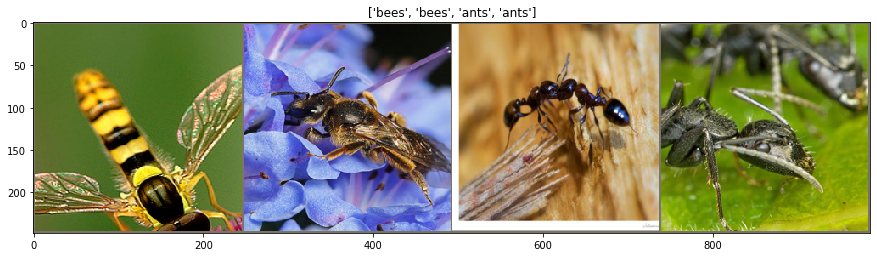

In [ ]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(15, 12))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)


# Получим 1 батч (картнки-метки) из обучающей выборки
inputs, classes = next(iter(dataloaders['train']))

# Расположим картинки рядом
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

In [ ]:
for i in dataloaders['train']:
    print(i[0][0])
    break

tensor([[[-1.6555, -1.6555, -1.6384,  ..., -1.6555, -1.6384, -1.6213],
         [-1.6555, -1.6555, -1.6555,  ..., -1.6555, -1.6384, -1.6213],
         [-1.6384, -1.6555, -1.6727,  ..., -1.6555, -1.6384, -1.6384],
         ...,
         [-1.8268, -1.8268, -1.8439,  ..., -1.8610, -1.8268, -1.8097],
         [-1.7925, -1.7925, -1.7925,  ..., -1.8268, -1.7925, -1.7754],
         [-1.7583, -1.7583, -1.7583,  ..., -1.8097, -1.7754, -1.7583]],

        [[-1.2829, -1.2829, -1.2829,  ..., -1.0903, -1.0728, -1.0553],
         [-1.2479, -1.2479, -1.2654,  ..., -1.0903, -1.0728, -1.0553],
         [-1.1954, -1.2129, -1.2304,  ..., -1.0903, -1.0728, -1.0728],
         ...,
         [-1.5980, -1.5980, -1.5805,  ..., -1.6155, -1.5980, -1.5805],
         [-1.5630, -1.5630, -1.5455,  ..., -1.5805, -1.5630, -1.5455],
         [-1.5280, -1.5280, -1.5280,  ..., -1.5630, -1.5455, -1.5280]],

        [[-1.1073, -1.1073, -1.1073,  ..., -1.0201, -1.0027, -0.9853],
         [-1.0898, -1.1073, -1.1073,  ..., -1

### Обучение моделей

Следующая функция будет использоваться для обучения модели. Аргументы:  
* model $-$ нейросеть
* loss $-$ оптимизируемая функция (criterion, cost function, objective)
* optimizer $-$ оптимизационный алгоритм (https://habr.com/ru/post/318970/)
* scheduler $-$ политика изменения learning_rate
* num_epochs $-$ количество итераций обучения

**Задание**: Вам нужно модифицировать эту функцию, чтобы она возвращала ещё и массивы loss'а на обучающей и валидационной выборках (чтобы потом Вы могли нарисовать графики). Можете модифицировать эту функцию как угодно, лишь бы она правильно работала.

In [ ]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25, custom_dataloaders=None, custom_dataset_sizes=None):
    since = time.time()

    # Используем переданные даталоадеры или глобальные
    use_dataloaders = custom_dataloaders if custom_dataloaders is not None else dataloaders
    use_dataset_sizes = custom_dataset_sizes if custom_dataset_sizes is not None else dataset_sizes

    best_model_wts = model.state_dict()
    best_acc = 0.0

    losses = {'train': [], 'val': []}
    accuracies = {'train': [], 'val': []}

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # каждая эпоха имеет обучающую и тестовую стадии
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train(True)  # установить модель в режим обучения
            else:
                model.train(False)  # установить модель в режим предсказания

            running_loss = 0.0
            running_corrects = 0

            # итерируемся по батчам
            for data in use_dataloaders[phase]:
                # получаем картинки и метки
                inputs, labels = data

                # оборачиваем в переменные
                if use_gpu:
                    inputs = inputs.cuda()
                    labels = labels.cuda()
                else:
                    inputs, labels = inputs, labels

                # инициализируем градиенты параметров
                optimizer.zero_grad()

                # forward pass
                outputs = model(inputs)
                _, preds = torch.max(outputs.data, 1)
                loss = criterion(outputs, labels)

                # backward pass + оптимизируем только если это стадия обучения
                if phase == 'train':
                    loss.backward()
                    optimizer.step()

                # статистика
                running_loss += loss.item()
                running_corrects += int(torch.sum(preds == labels.data))

            epoch_loss = running_loss / use_dataset_sizes[phase]
            epoch_acc = running_corrects / use_dataset_sizes[phase]

            losses[phase].append(epoch_loss)
            accuracies[phase].append(epoch_acc)

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # если достиглось лучшее качество, то запомним веса модели
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = model.state_dict()

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # загрузим лучшие веса модели
    model.load_state_dict(best_model_wts)
    return model, losses, accuracies

* Функция для отрисовки тестовых изображений и предсказаний для них:

In [ ]:
def visualize_model(model, num_images=6):
    images_so_far = 0
    fig = plt.figure(figsize=(12, 8))

    model.eval()
    with torch.no_grad():
        for i, data in enumerate(dataloaders['val']):
            inputs, labels = data
            if use_gpu:
                inputs, labels = inputs.cuda(), labels.cuda()

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images // 2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                
                # Денормализация изображения для отображения
                inp = inputs.cpu().data[j]
                inp = inp.numpy().transpose((1, 2, 0))
                mean = np.array([0.485, 0.456, 0.406])
                std = np.array([0.229, 0.224, 0.225])
                inp = std * inp + mean
                inp = np.clip(inp, 0, 1)
                
                plt.imshow(inp)

                if images_so_far == num_images:
                    return
    plt.show()

* Функция для измерения точности модели на валидационном датасете

In [ ]:
def evaluate(model, custom_dataloaders=None, custom_dataset_sizes=None):
    model.train(False)

    # Используем переданные даталоадеры или глобальные
    use_dataloaders = custom_dataloaders if custom_dataloaders is not None else dataloaders
    use_dataset_sizes = custom_dataset_sizes if custom_dataset_sizes is not None else dataset_sizes

    running_correct = 0
    for data in use_dataloaders['val']:
        # получаем картинки и метки
        inputs, labels = data

        # переносим на gpu, если возможно
        if use_gpu:
            inputs = inputs.cuda()
            labels = labels.cuda()

        # forward pass
        with torch.no_grad():
            output = model(inputs)
            _, predicted = torch.max(output, 1)

            running_correct += int(torch.sum(predicted == labels))

    return running_correct / use_dataset_sizes['val']

### Задание

Для каждой из следующих нейросетей:
* **AlexNet**
* **VGG16**
* **Inception_v3**

Напишите код и выведите результат (график лосса, accuracy и вывод примера классификации картинок с визализацией (с помощью функции `vizualize_model()`)) для трёх способов:
* Использование готовой нейросети **"из коробки"**
* Использование нейросети как **Feature Extractor**
* **Fine Tuning** нейросети

Для каждого пункта нужно:
* сделать с сетью то, что нужно в пункте ("из коробки", FE или FT)
* вывести график loss'а на обучающей и на валидационной выборке
* вывести качество модели (accuracy) на валидационной (тестовой) выборке
* (по желанию) использовать функцию visualize_model()

### AlexNet

*ПРИМЕЧАНИЕ: Здесь не выведены графики loss'а и не использована visualize_model(). От Вас это ожидается.*

Загрузка модели:

In [ ]:
from ipywidgets import FloatProgress

In [ ]:
model = models.alexnet(pretrained=True)

Посмотрим, что внутри:

In [ ]:
model

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

Видим, что на вход классификатору (classifier) подаётся *9216 признаков*. Это и будет размер входа для нашего нового классификатора.

* **Fine Tuning** способ

Сконфигурируем - изменим FC-слой и зададим *cost function* и *оптимизирующий алгоритм*:

(*по умолчанию backpropagation распространяется на все слои, поэтому здесь мы только заменяем FC-слой на свой классификатор*)

In [ ]:
# AlexNet - Fine Tuning подход

# Загружаем предобученную модель AlexNet
model_alexnet_ft = models.alexnet(pretrained=True)

# num_features -- это размерность вектора фич, поступающего на вход FC-слою
num_features = model_alexnet_ft.classifier[6].in_features

# Заменяем Fully-Connected слой на наш линейный классификатор
model_alexnet_ft.classifier[6] = nn.Linear(num_features, 2)

# Использовать ли GPU
if use_gpu:
    model_alexnet_ft = model_alexnet_ft.cuda()

# В качестве cost function используем кросс-энтропию
loss_fn = nn.CrossEntropyLoss()

# В качестве оптимизатора - стохастический градиентный спуск (обучаем всю сеть)
optimizer_ft = optim.SGD(model_alexnet_ft.parameters(), lr=0.001, momentum=0.9)

# Умножает learning_rate на 0.1 каждые 7 эпох
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

print("AlexNet Fine Tuning модель готова")
print(f"Обучаемых параметров: {sum(p.numel() for p in model_alexnet_ft.parameters() if p.requires_grad)}")

In [ ]:
# Обучение AlexNet Fine Tuning
print("Начинаем обучение AlexNet (Fine Tuning)...")
model_alexnet_ft, losses_alexnet_ft, accuracies_alexnet_ft = train_model(
    model_alexnet_ft, loss_fn, optimizer_ft, exp_lr_scheduler, num_epochs=10
)
print("Обучение AlexNet Fine Tuning завершено!")

Epoch 0/24
----------


C:\ProgramData\Anaconda3\envs\torch\lib\site-packages\torch\optim\lr_scheduler.py:122: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)


train Loss: 0.2691 Acc: 0.5615
val Loss: 0.1764 Acc: 0.5294

Epoch 1/24
----------
train Loss: 0.1752 Acc: 0.4426
val Loss: 0.1763 Acc: 0.5621

Epoch 2/24
----------
train Loss: 0.1727 Acc: 0.5615
val Loss: 0.1729 Acc: 0.6144

Epoch 3/24
----------
train Loss: 0.1738 Acc: 0.4877
val Loss: 0.1765 Acc: 0.5490

Epoch 4/24
----------
train Loss: 0.1735 Acc: 0.4959
val Loss: 0.1765 Acc: 0.5425

Epoch 5/24
----------
train Loss: 0.1733 Acc: 0.4713
val Loss: 0.1766 Acc: 0.5359

Epoch 6/24
----------
train Loss: 0.1733 Acc: 0.5041
val Loss: 0.1767 Acc: 0.5359

Epoch 7/24
----------
train Loss: 0.1733 Acc: 0.4795
val Loss: 0.1767 Acc: 0.5425

Epoch 8/24
----------
train Loss: 0.1733 Acc: 0.4959
val Loss: 0.1767 Acc: 0.5490

Epoch 9/24
----------
train Loss: 0.1733 Acc: 0.4713
val Loss: 0.1767 Acc: 0.5490

Epoch 10/24
----------
train Loss: 0.1733 Acc: 0.4959
val Loss: 0.1767 Acc: 0.5425

Epoch 11/24
----------
train Loss: 0.1733 Acc: 0.4631
val Loss: 0.1767 Acc: 0.4575

Epoch 12/24
----------
t

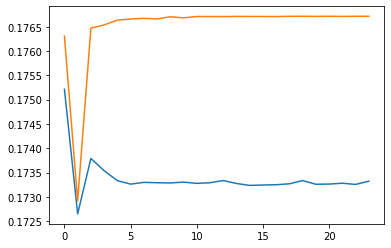

In [ ]:
# Построим график лосса при обучении и валидации

# Отображение графиков для AlexNet Fine Tuning
plot_losses(losses_alexnet_ft, "AlexNet Fine Tuning - Training and Validation Loss")
plot_accuracies(accuracies_alexnet_ft, "AlexNet Fine Tuning - Training and Validation Accuracy")

In [ ]:
from torch.autograd import Variable

In [ ]:
torch.save(model.state_dict(), '1AlexNet_fine_tune.pth')

In [ ]:
model.load_state_dict(torch.load('1AlexNet_fine_tune.pth'))

<All keys matched successfully>

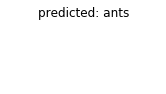

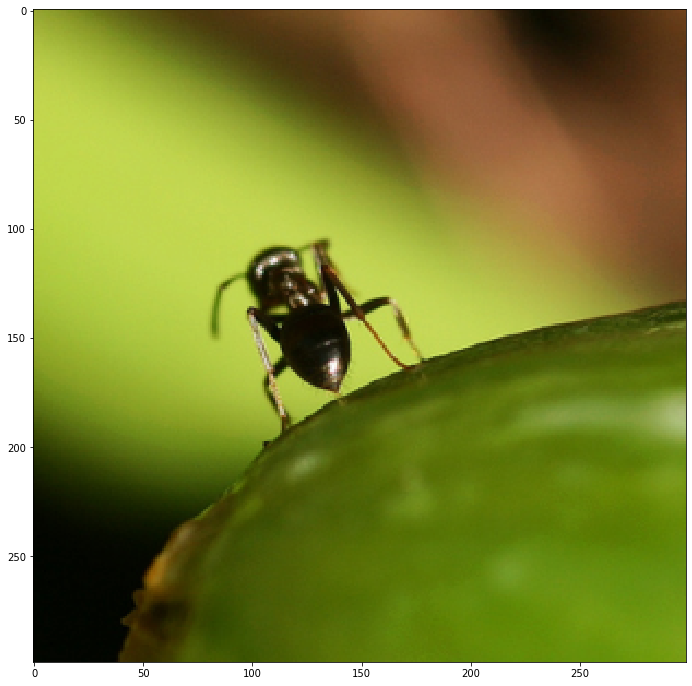

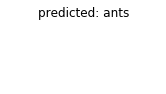

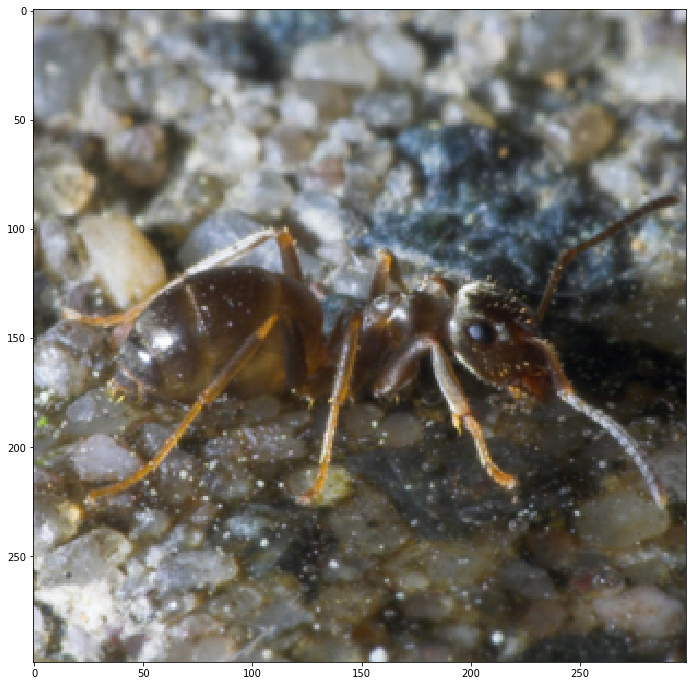

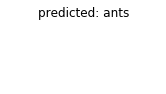

...

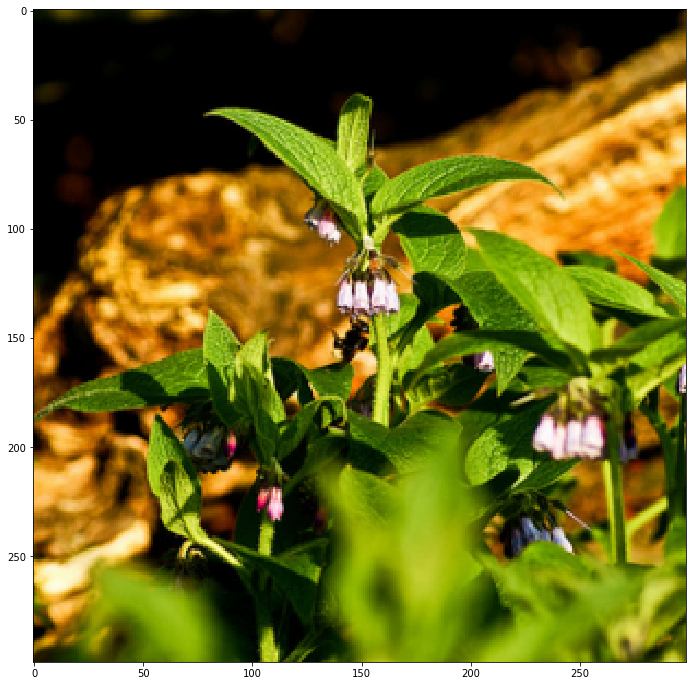

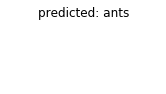

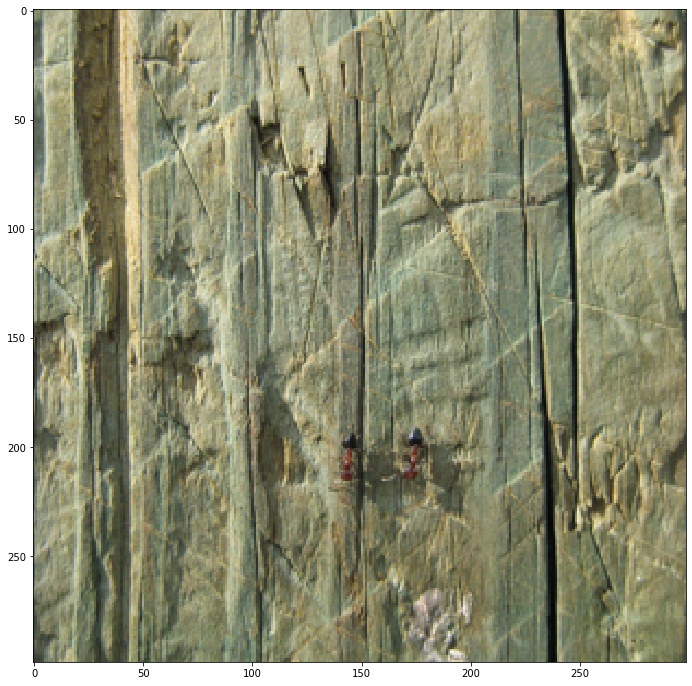

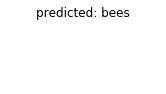

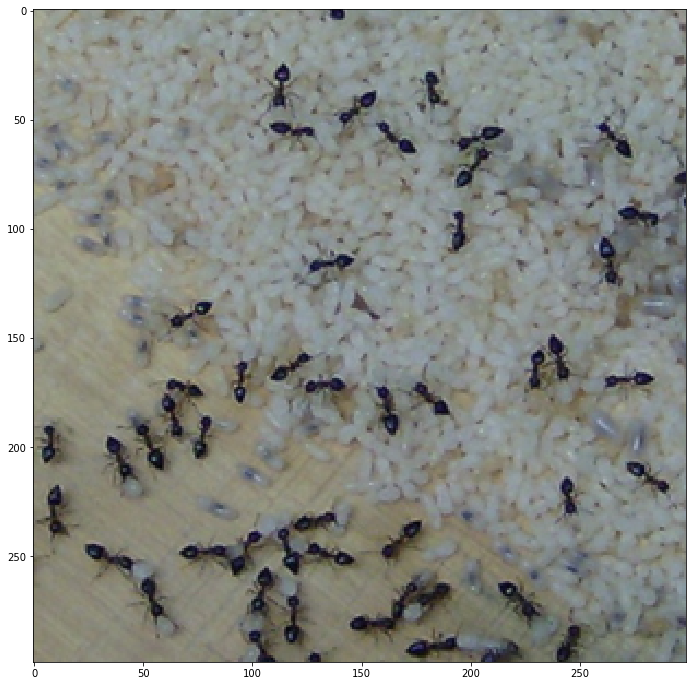

In [ ]:
visualize_model(model)

In [ ]:
print("Accuracy: {0:.4f}".format(evaluate(model)))

Accuracy: 0.4575


Видим, что Fine Tuning AlexNet'а не дал хороших результатов, поскольку качество получается ~70%, что маловато для свёрточной нейросети для задачи классификации картинок. Посмотрим, как будет с AlexNet в роли Feature Extractor'а.

* **Feature Extractor** способ:

In [ ]:
model_extractor = models.alexnet(pretrained=True)

Помним, что по-умолчанию все слои нейросети обучаются заново:

In [ ]:
for param in model_extractor.parameters():
    print(param.requires_grad)

True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


Сделаем так, чтобы на них *не распространялся backpropagation* (заморозим их), и подменим классификатор (ведь старый уже с весами для ImageNet'а).

In [ ]:
# AlexNet - Feature Extractor подход

# Загружаем предобученную модель AlexNet
model_alexnet_fe = models.alexnet(pretrained=True)

# замораживаем параметры (веса)
for param in model_alexnet_fe.parameters():
    param.requires_grad = False

# num_features -- это размерность вектора фич, поступающего на вход FC-слою
num_features = model_alexnet_fe.classifier[6].in_features

# Заменяем Fully-Connected слой на наш линейный классификатор
model_alexnet_fe.classifier[6] = nn.Linear(num_features, 2)

# Использовать ли GPU
if use_gpu:
    model_alexnet_fe = model_alexnet_fe.cuda()

# В качестве cost function используем кросс-энтропию
loss_fn = nn.CrossEntropyLoss()

# Обучаем только классификатор
optimizer = optim.SGD(model_alexnet_fe.classifier[6].parameters(), lr=0.001, momentum=0.9)

# Умножает learning_rate на 0.1 каждые 7 эпох
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

print("AlexNet Feature Extractor модель готова")
print(f"Обучаемых параметров: {sum(p.numel() for p in model_alexnet_fe.parameters() if p.requires_grad)}")
print(f"Всего параметров: {sum(p.numel() for p in model_alexnet_fe.parameters())}")

In [ ]:
%%time
# Обучение AlexNet Feature Extractor
print("Начинаем обучение AlexNet (Feature Extractor)...")
model_extractor, losses = train_model(
    model_extractor, loss_fn, optimizer, exp_lr_scheduler, num_epochs=25
)
print("Обучение AlexNet Feature Extractor завершено!")

Epoch 0/24
----------


C:\ProgramData\Anaconda3\envs\torch\lib\site-packages\torch\optim\lr_scheduler.py:122: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)


train Loss: 0.7119 Acc: 0.6967
val Loss: 1.1417 Acc: 0.7582

Epoch 1/24
----------
train Loss: 0.7681 Acc: 0.8074
val Loss: 0.6692 Acc: 0.8824

Epoch 2/24
----------
train Loss: 0.5071 Acc: 0.8484
val Loss: 0.6539 Acc: 0.8562

Epoch 3/24
----------
train Loss: 0.3722 Acc: 0.8689
val Loss: 0.6881 Acc: 0.9150

Epoch 4/24
----------
train Loss: 0.4580 Acc: 0.8525
val Loss: 1.3078 Acc: 0.8235

Epoch 5/24
----------
train Loss: 0.3421 Acc: 0.9098
val Loss: 1.2642 Acc: 0.8105

Epoch 6/24
----------
train Loss: 0.5269 Acc: 0.8893
val Loss: 0.8413 Acc: 0.9020

Epoch 7/24
----------
train Loss: 0.2443 Acc: 0.9016
val Loss: 0.7927 Acc: 0.9020

Epoch 8/24
----------
train Loss: 0.3249 Acc: 0.8934
val Loss: 0.7905 Acc: 0.9020

Epoch 9/24
----------
train Loss: 0.3177 Acc: 0.8934
val Loss: 0.7646 Acc: 0.9150

Epoch 10/24
----------
train Loss: 0.2915 Acc: 0.8852
val Loss: 0.7851 Acc: 0.9020

Epoch 11/24
----------
train Loss: 0.3090 Acc: 0.8934
val Loss: 0.8546 Acc: 0.8889

Epoch 12/24
----------
t

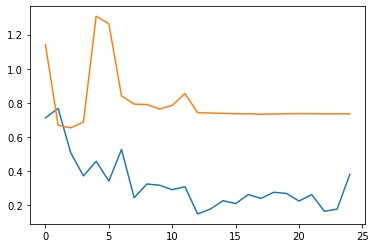

In [ ]:
# Отображение графиков для AlexNet Feature Extractor
plot_losses(losses_alexnet_fe, "AlexNet Feature Extractor - Training and Validation Loss")
plot_accuracies(accuracies_alexnet_fe, "AlexNet Feature Extractor - Training and Validation Accuracy")

In [ ]:
torch.save(model_extractor.state_dict(), '2AlexNet_extractor.pth')

In [ ]:
model_extractor.load_state_dict(torch.load('2AlexNet_extractor.pth'))

<All keys matched successfully>

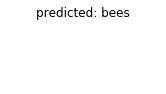

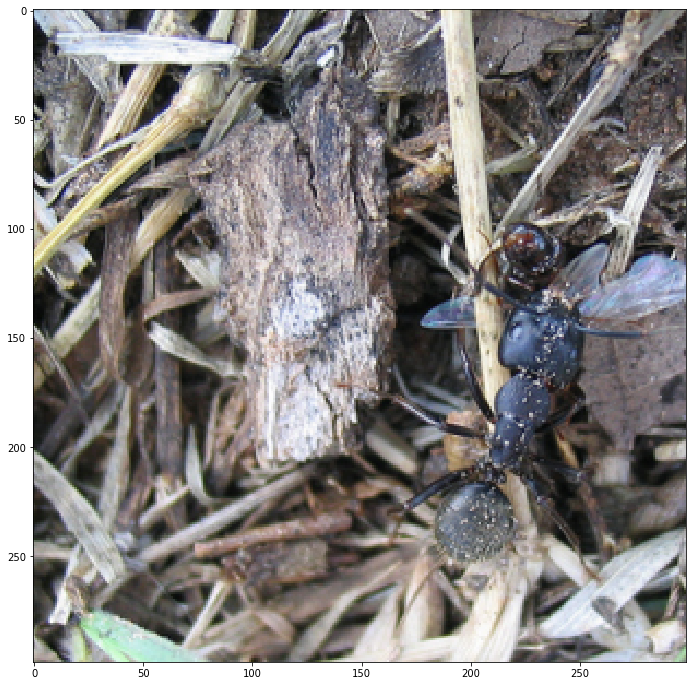

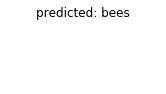

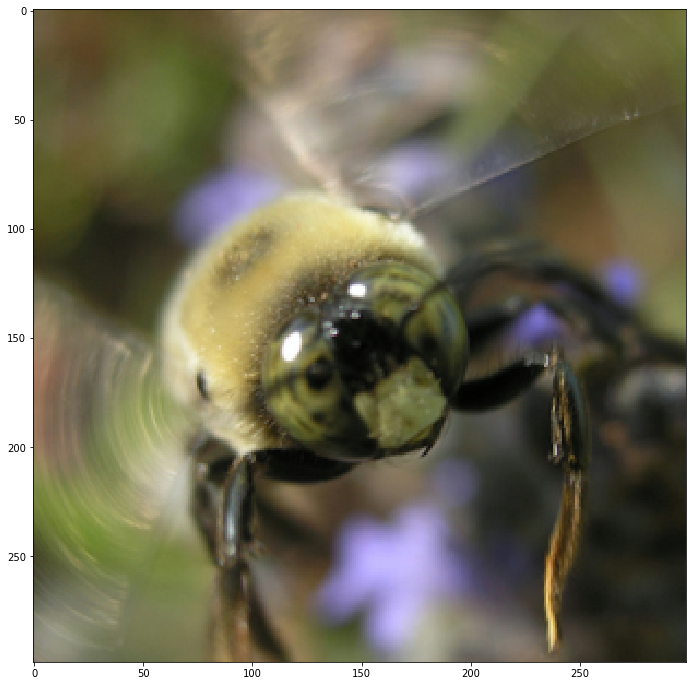

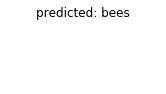

...

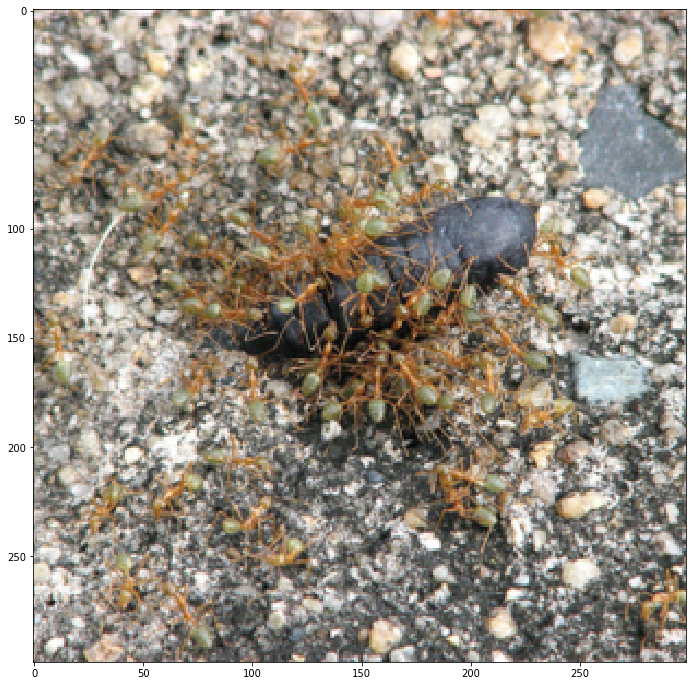

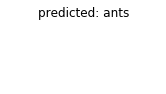

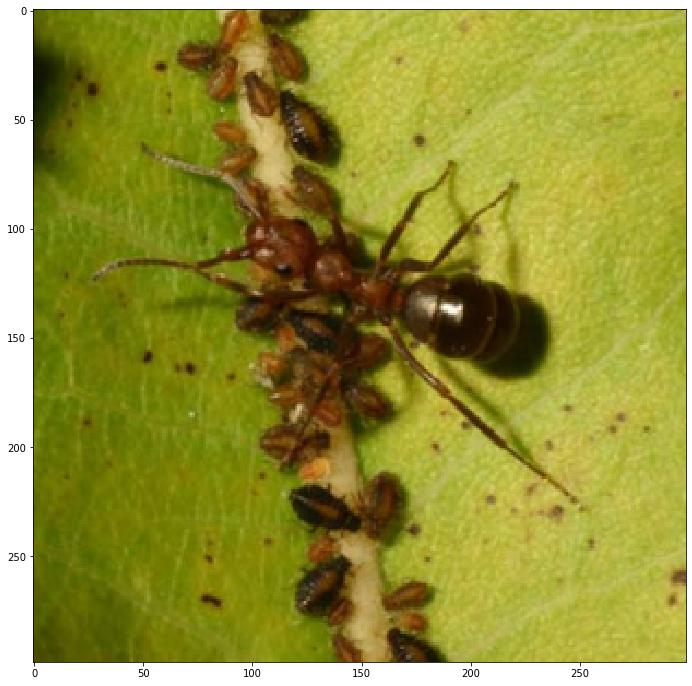

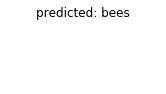

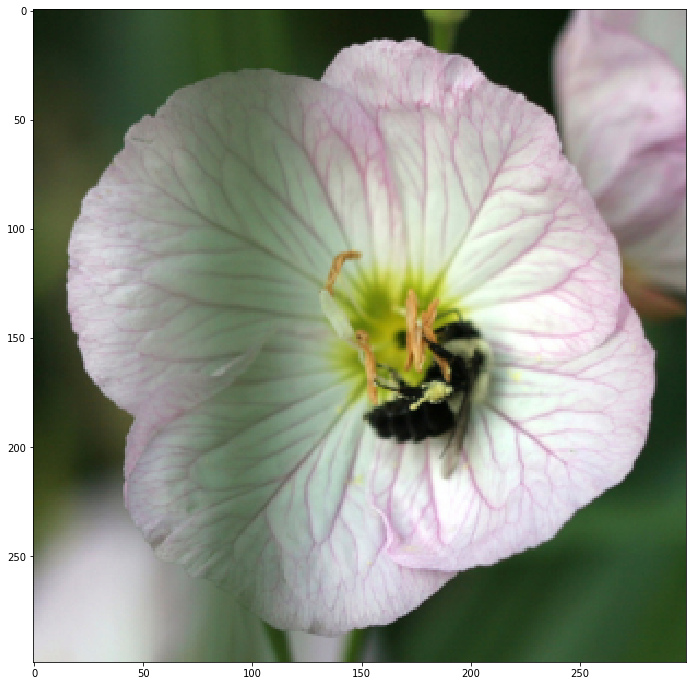

In [ ]:
visualize_model(model_extractor)

In [ ]:
print("Accuracy: {0:.4f}".format(evaluate(model_extractor)))

Accuracy: 0.8889


Видим, что качество намного лучше: ~90%.

* **Смешанный** способ:
Мы будем обучать не только последний **fully connected** слой, но и несколько предпоследних

In [ ]:
model_mixed = models.alexnet(pretrained=True)

In [ ]:
layers_to_unfreeze = 5

# Выключаем подсчет градиентов для слоев, которые не будем обучать
for param in model_mixed.features[:-layers_to_unfreeze].parameters():
    param.requires_grad = False

# num_features -- это размерность вектора фич, поступающего на вход FC-слою
num_features = 9216
# Заменяем Fully-Connected слой на наш линейный классификатор
model_mixed.classifier = nn.Linear(num_features, 2)

# Использовать ли GPU
if use_gpu:
    model_mixed = model_mixed.cuda()

# В качестве cost function используем кросс-энтропию
loss_fn = nn.CrossEntropyLoss()

# Обучаем последние layers_to_unfreeze слоев из сверточной части и fully connected слой
# parameters() возвращает просто список тензоров парамтеров, поэтому два таких списка можно сложить
optimizer = optim.SGD(list(model_mixed.features.parameters())[-layers_to_unfreeze:] +
                      list(model_mixed.classifier.parameters()), lr=0.001, momentum=0.9)

# Умножает learning_rate на 0.1 каждые 7 эпох (это одна из эвристик, не было на лекциях)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [ ]:
%%time
_, losses = train_model(model_mixed, loss_fn, optimizer, exp_lr_scheduler, num_epochs=25)

Epoch 0/24
----------


C:\ProgramData\Anaconda3\envs\torch\lib\site-packages\torch\optim\lr_scheduler.py:122: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)


train Loss: 0.2833 Acc: 0.7213
val Loss: 0.0972 Acc: 0.8366

Epoch 1/24
----------
train Loss: 0.0875 Acc: 0.8607
val Loss: 0.1402 Acc: 0.8497

Epoch 2/24
----------
train Loss: 0.0702 Acc: 0.9016
val Loss: 0.0910 Acc: 0.9020

Epoch 3/24
----------
train Loss: 0.0466 Acc: 0.9180
val Loss: 0.1068 Acc: 0.8954

Epoch 4/24
----------
train Loss: 0.0591 Acc: 0.8934
val Loss: 0.1118 Acc: 0.8889

Epoch 5/24
----------
train Loss: 0.0405 Acc: 0.9303
val Loss: 0.1273 Acc: 0.8824

Epoch 6/24
----------
train Loss: 0.0421 Acc: 0.9426
val Loss: 0.1287 Acc: 0.8824

Epoch 7/24
----------
train Loss: 0.0333 Acc: 0.9385
val Loss: 0.1255 Acc: 0.8889

Epoch 8/24
----------
train Loss: 0.0273 Acc: 0.9631
val Loss: 0.1260 Acc: 0.8889

Epoch 9/24
----------
train Loss: 0.0253 Acc: 0.9631
val Loss: 0.1294 Acc: 0.8889

Epoch 10/24
----------
train Loss: 0.0315 Acc: 0.9426
val Loss: 0.1197 Acc: 0.8954

Epoch 11/24
----------
train Loss: 0.0329 Acc: 0.9549
val Loss: 0.1275 Acc: 0.8954

Epoch 12/24
----------
t

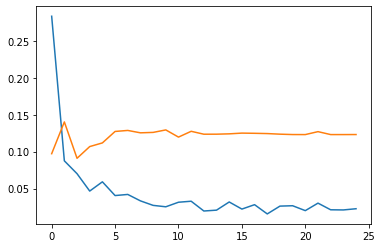

In [ ]:
plt.plot(losses['train'])
plt.plot(losses['val'])

In [ ]:
torch.save(model_mixed.state_dict(), '3AlexNet_mixed.pth')

In [ ]:
model_mixed.load_state_dict(torch.load('3AlexNet_mixed.pth'))

<All keys matched successfully>

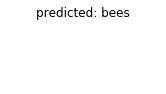

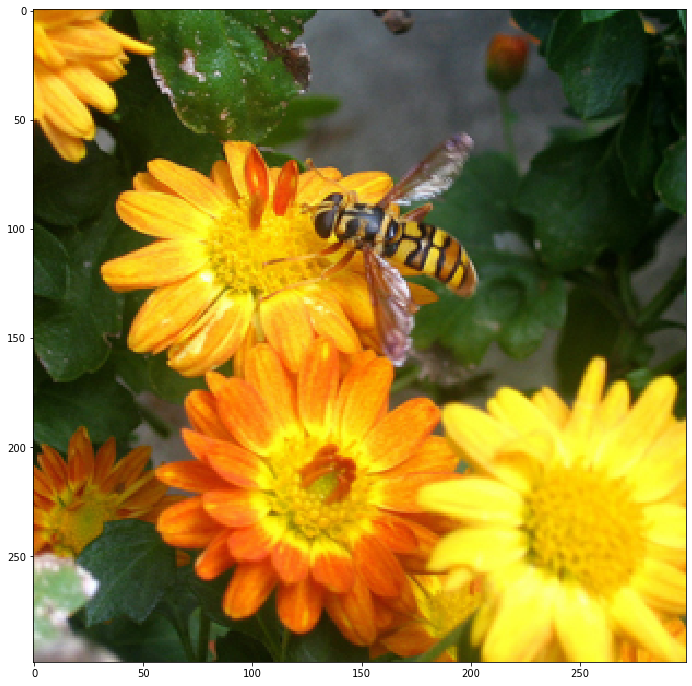

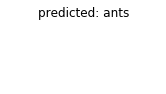

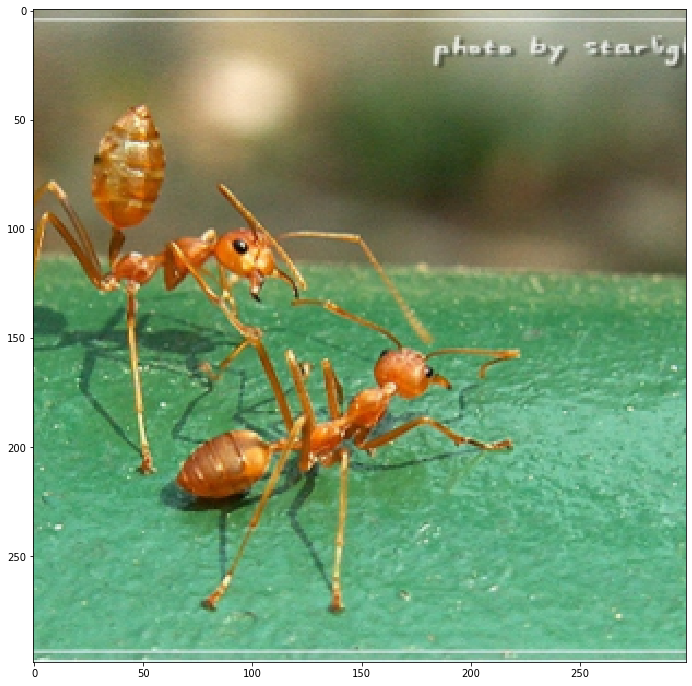

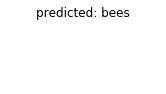

...

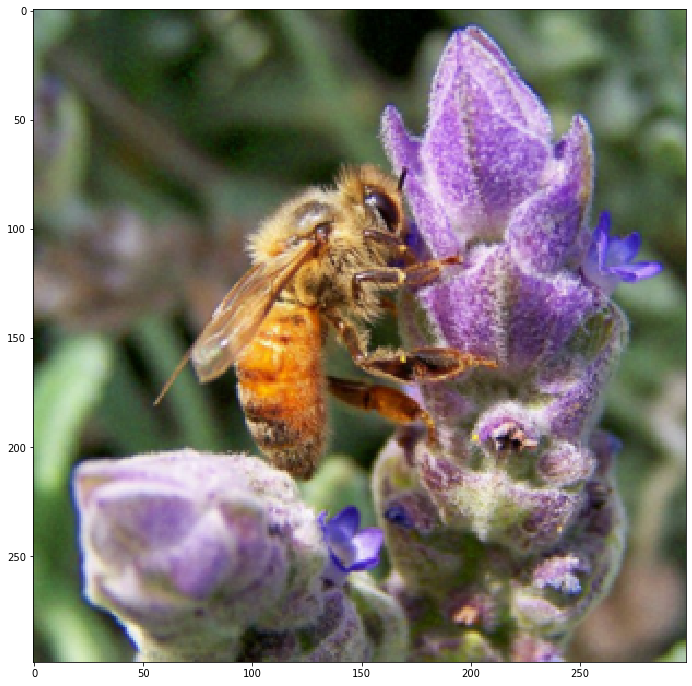

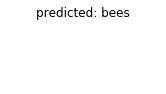

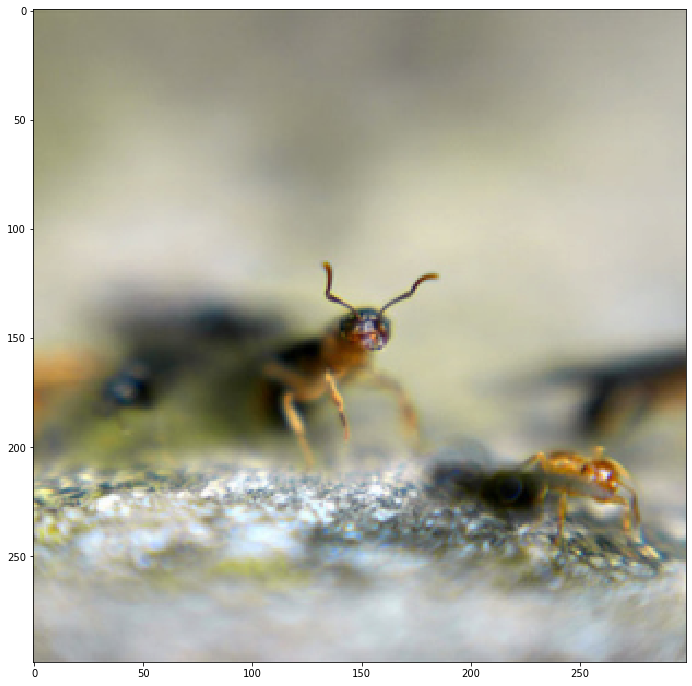

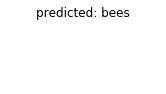

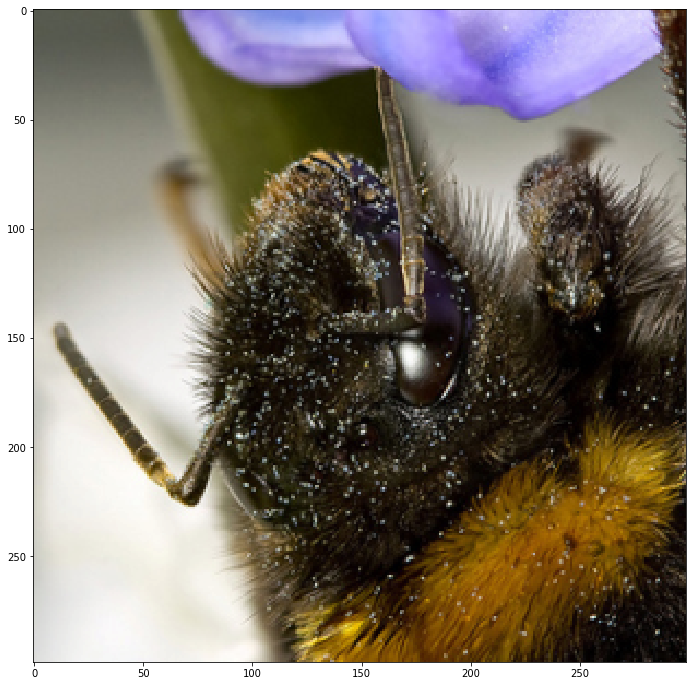

In [ ]:
visualize_model(model_mixed)

In [ ]:
print("Accuracy: {0:.4f}".format(evaluate(model_mixed)))

Accuracy: 0.9020


**Вопрос 1 (важный):** С чем связано повышение качества если мы перестаем учить всю сеть? (Подсказка: посмотрите на датасет и на то, как он согласуется с 4-мя ситуациями, описанными выше)

**Вопрос 2**: Почему разморозка последних слоев не дает прироста к точности, хотя разморозить несколько послдних слоев обычно хорошеее решение для классификации похожего датасета? (Вопрос на внимательность)

### Другие, более современные нейросети

**Вопрос:** Какую стратегию Вы выберете, учитывая размер и специфику нового датасета?

### VGG16

In [ ]:
# Ваш код здесь

# VGG16 - Feature Extractor подход

# Загружаем предобученную модель VGG16
model_vgg16 = models.vgg16(pretrained=True)

# Замораживаем все параметры
for param in model_vgg16.parameters():
    param.requires_grad = False

# Получаем размерность входа в классификатор
num_features = model_vgg16.classifier[6].in_features

# Заменяем последний слой классификатора
model_vgg16.classifier[6] = nn.Linear(num_features, 2)

# Переносим на GPU если доступно
if use_gpu:
    model_vgg16 = model_vgg16.cuda()

# Задаем функцию потерь
loss_fn = nn.CrossEntropyLoss()

# Оптимизируем только параметры классификатора
optimizer = optim.SGD(model_vgg16.classifier.parameters(), lr=0.001, momentum=0.9)

# Планировщик learning rate
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

print("VGG16 модель готова к обучению (Feature Extractor)")
print(f"Обучаемых параметров: {sum(p.numel() for p in model_vgg16.parameters() if p.requires_grad)}")
print(f"Всего параметров: {sum(p.numel() for p in model_vgg16.parameters())}")


In [ ]:
# Обучение VGG16
print("Начинаем обучение VGG16...")
model_vgg16, losses_vgg16, accuracies_vgg16 = train_model(
    model_vgg16, loss_fn, optimizer, exp_lr_scheduler, num_epochs=10
)
print("Обучение VGG16 завершено!")

Epoch 0/24
----------


C:\ProgramData\Anaconda3\envs\torch\lib\site-packages\torch\optim\lr_scheduler.py:122: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)


train Loss: 0.2418 Acc: 0.8074
val Loss: 0.1710 Acc: 0.9477

Epoch 1/24
----------
train Loss: 0.1448 Acc: 0.9057
val Loss: 0.2664 Acc: 0.9346

Epoch 2/24
----------
train Loss: 0.1657 Acc: 0.8975
val Loss: 0.3308 Acc: 0.9085

Epoch 3/24
----------
train Loss: 0.1638 Acc: 0.9303
val Loss: 0.2063 Acc: 0.9477

Epoch 4/24
----------
train Loss: 0.1099 Acc: 0.9262
val Loss: 0.2788 Acc: 0.9412

Epoch 5/24
----------
train Loss: 0.0825 Acc: 0.9344
val Loss: 0.2613 Acc: 0.9150

Epoch 6/24
----------
train Loss: 0.0984 Acc: 0.9467
val Loss: 0.2210 Acc: 0.9216

Epoch 7/24
----------
train Loss: 0.1063 Acc: 0.9344
val Loss: 0.2019 Acc: 0.9216

Epoch 8/24
----------
train Loss: 0.0743 Acc: 0.9426
val Loss: 0.2015 Acc: 0.9477

Epoch 9/24
----------
train Loss: 0.0665 Acc: 0.9344
val Loss: 0.2140 Acc: 0.9412

Epoch 10/24
----------
train Loss: 0.0526 Acc: 0.9631
val Loss: 0.2286 Acc: 0.9477

Epoch 11/24
----------
train Loss: 0.0550 Acc: 0.9549
val Loss: 0.2065 Acc: 0.9412

Epoch 12/24
----------
t

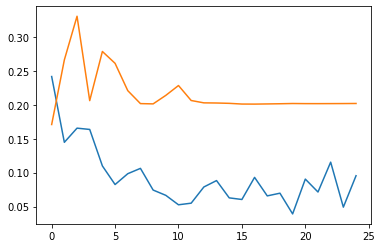

In [ ]:
# Отображение графиков для VGG16
plot_losses(losses_vgg16, "VGG16 - Training and Validation Loss")
plot_accuracies(accuracies_vgg16, "VGG16 - Training and Validation Accuracy")

In [ ]:
torch.save(model_extractor.state_dict(), '4VGG16.pth')

In [ ]:
model_extractor.load_state_dict(torch.load('4VGG16.pth'))

<All keys matched successfully>

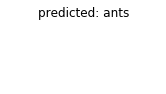

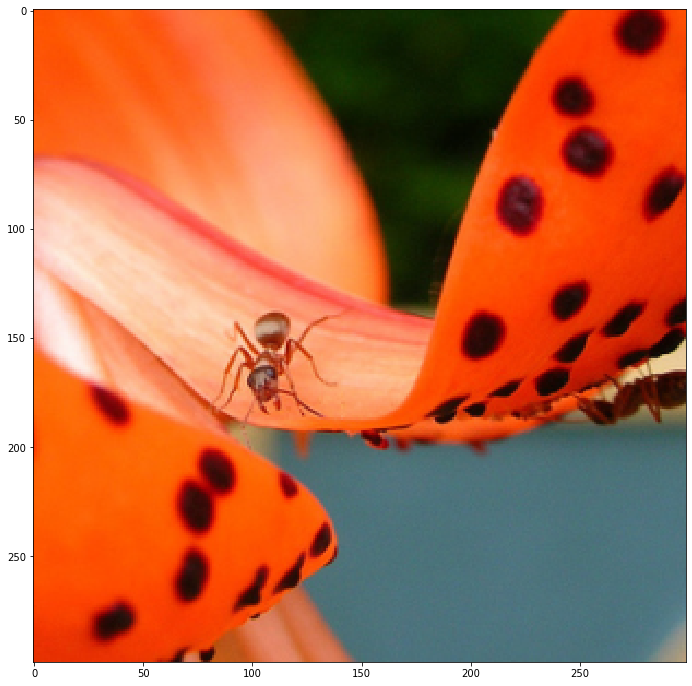

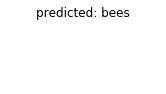

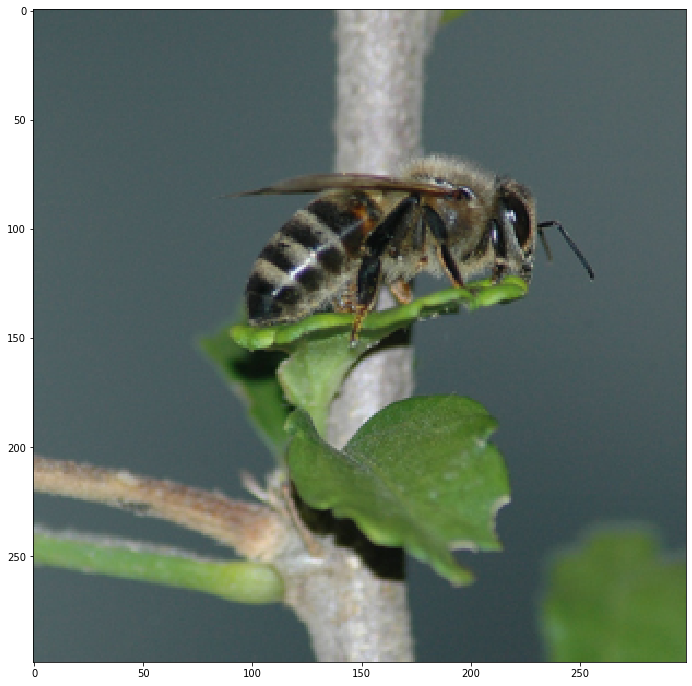

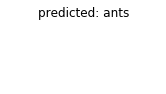

...

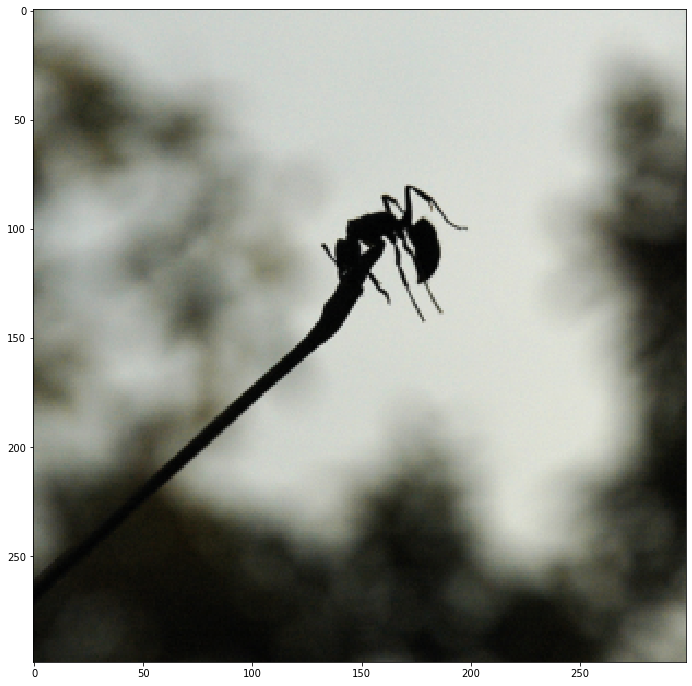

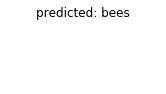

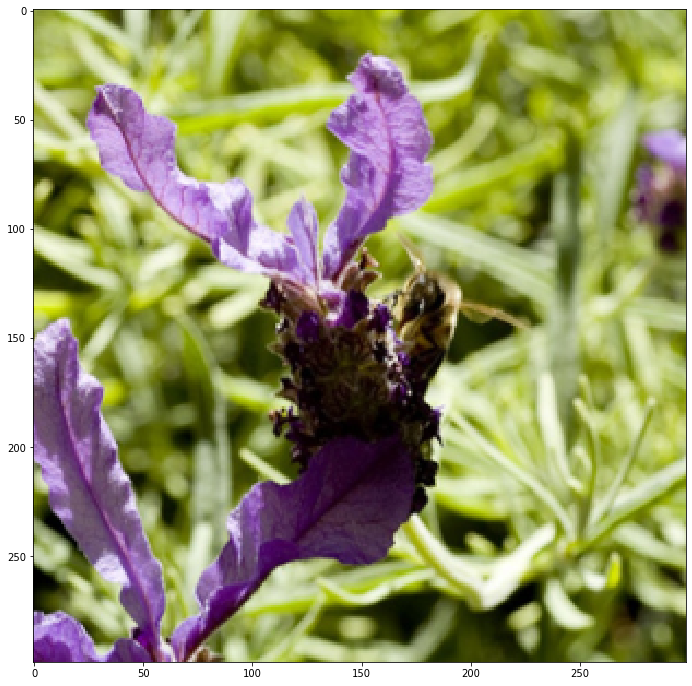

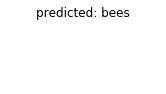

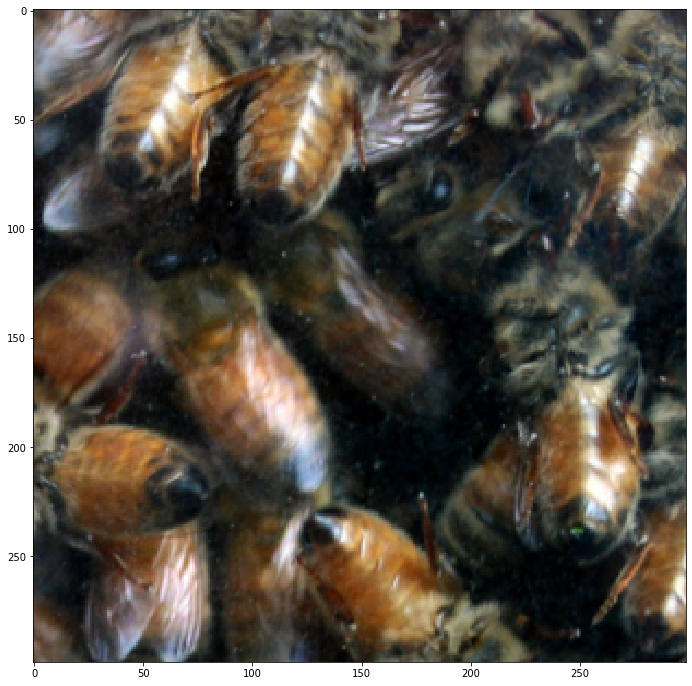

In [ ]:
visualize_model(model_extractor)

In [ ]:
print("Accuracy: {0:.4f}".format(evaluate(model_extractor)))

Accuracy: 0.9542


### Inception_v3

In [ ]:
# Нужно поменять размер картинок на 299, иначе будет ошибка, так как размерность станет отрицательной.
# Это вызвано тем, что нейросеть изначально обучалась на картинках размера 299.

# Результирующий размер картинок определяется трансформациями

# Inception_v3 - Feature Extractor подход

# Для Inception_v3 нужно изменить размер входных изображений на 299x299
data_transforms_inception = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(299),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(342),
        transforms.CenterCrop(299),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

# Обновляем датасет для Inception
image_datasets_inception = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                                    data_transforms_inception[x])
                           for x in ['train', 'val']}

dataloaders_inception = {x: torch.utils.data.DataLoader(image_datasets_inception[x], batch_size=4,
                                                       shuffle=True, num_workers=0)
                        for x in ['train', 'val']}

# Загружаем предобученную модель Inception_v3
model_inception = models.inception_v3(pretrained=True)
model_inception.aux_logits = False  # Отключаем вспомогательные выходы

# Замораживаем все параметры
for param in model_inception.parameters():
    param.requires_grad = False

# Получаем размерность входа в классификатор
num_features = model_inception.fc.in_features

# Заменяем последний слой классификатора
model_inception.fc = nn.Linear(num_features, 2)

# Переносим на GPU если доступно
if use_gpu:
    model_inception = model_inception.cuda()

# Задаем функцию потерь
loss_fn_inception = nn.CrossEntropyLoss()

# Оптимизируем только параметры классификатора
optimizer_inception = optim.SGD(model_inception.fc.parameters(), lr=0.001, momentum=0.9)

# Планировщик learning rate
exp_lr_scheduler_inception = lr_scheduler.StepLR(optimizer_inception, step_size=7, gamma=0.1)

print("Inception_v3 модель готова к обучению (Feature Extractor)")
print(f"Обучаемых параметров: {sum(p.numel() for p in model_inception.parameters() if p.requires_grad)}")
print(f"Всего параметров: {sum(p.numel() for p in model_inception.parameters())}")


In [ ]:
%%time
# Обучение Inception_v3
print("Начинаем обучение Inception_v3...")
dataset_sizes_inception = {x: len(image_datasets_inception[x]) for x in ['train', 'val']}

model_inception, losses_inception, accuracies_inception = train_model(
    model_inception, loss_fn_inception, optimizer_inception, exp_lr_scheduler_inception, 
    num_epochs=10, custom_dataloaders=dataloaders_inception, custom_dataset_sizes=dataset_sizes_inception
)
print("Обучение Inception_v3 завершено!")

Epoch 0/24
----------
train Loss: 0.0738 Acc: 0.9631
val Loss: 0.2021 Acc: 0.9412

Epoch 1/24
----------
train Loss: 0.0427 Acc: 0.9549
val Loss: 0.2021 Acc: 0.9412

Epoch 2/24
----------
train Loss: 0.0601 Acc: 0.9631
val Loss: 0.2021 Acc: 0.9412

Epoch 3/24
----------
train Loss: 0.0723 Acc: 0.9344
val Loss: 0.2021 Acc: 0.9412

Epoch 4/24
----------
train Loss: 0.0705 Acc: 0.9549
val Loss: 0.2021 Acc: 0.9412

Epoch 5/24
----------
train Loss: 0.1122 Acc: 0.9344
val Loss: 0.2021 Acc: 0.9412

Epoch 6/24
----------
train Loss: 0.1005 Acc: 0.9426
val Loss: 0.2021 Acc: 0.9412

Epoch 7/24
----------
train Loss: 0.0418 Acc: 0.9590
val Loss: 0.2021 Acc: 0.9412

Epoch 8/24
----------
train Loss: 0.0712 Acc: 0.9467
val Loss: 0.2021 Acc: 0.9412

Epoch 9/24
----------
train Loss: 0.0866 Acc: 0.9467
val Loss: 0.2021 Acc: 0.9412

Epoch 10/24
----------
train Loss: 0.0833 Acc: 0.9385
val Loss: 0.2021 Acc: 0.9412

Epoch 11/24
----------
train Loss: 0.0929 Acc: 0.9549
val Loss: 0.2021 Acc: 0.9412

Ep

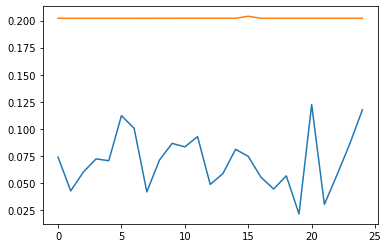

In [ ]:
# Отображение графиков для Inception_v3
plot_losses(losses_inception, "Inception_v3 - Training and Validation Loss")
plot_accuracies(accuracies_inception, "Inception_v3 - Training and Validation Accuracy")

In [ ]:
torch.save(model_extractor.state_dict(), '5Inceptionv3.pth')

In [ ]:
model_extractor.load_state_dict(torch.load('5Inceptionv3.pth'))

<All keys matched successfully>

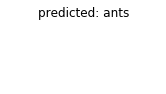

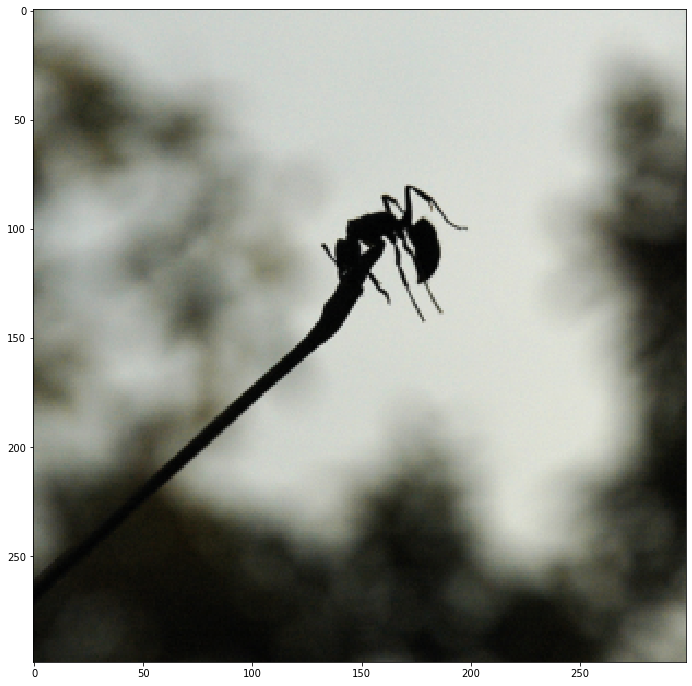

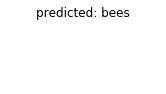

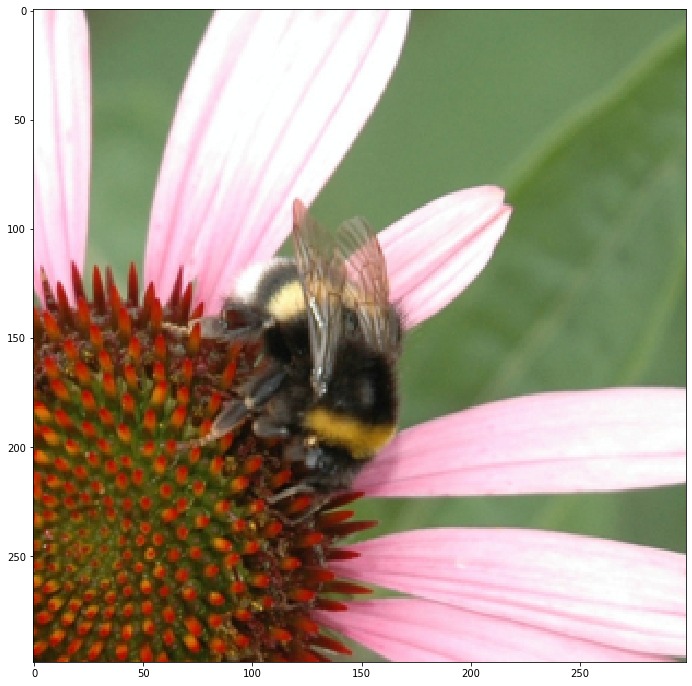

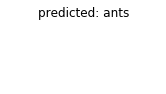

...

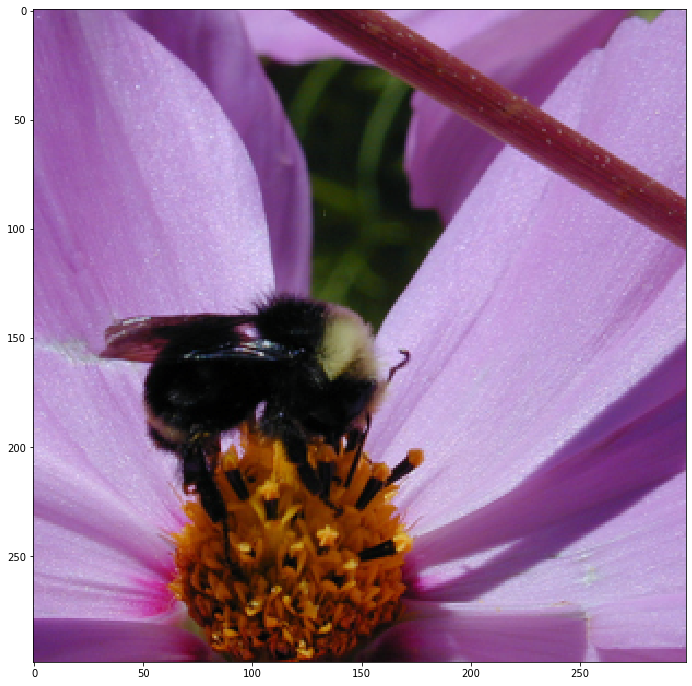

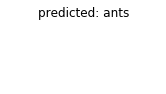

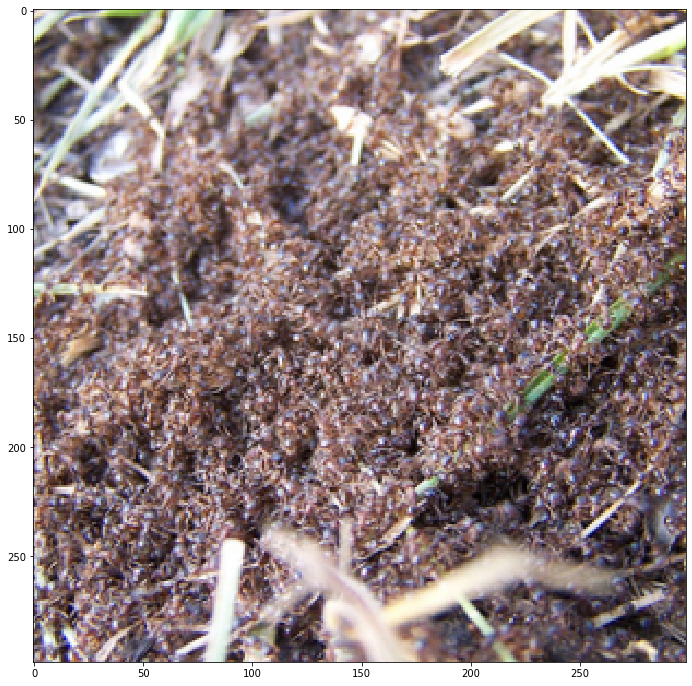

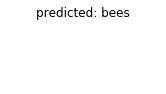

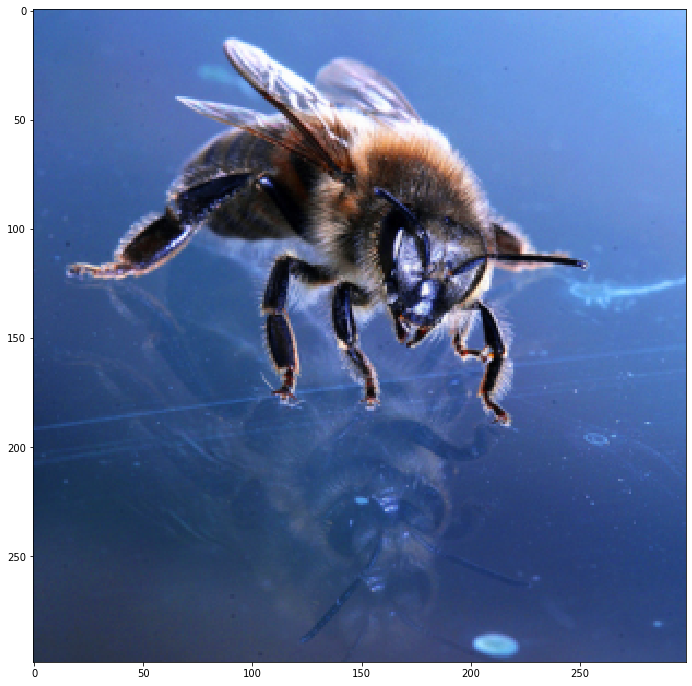

In [ ]:
visualize_model(model_extractor)

In [ ]:
print("Accuracy: {0:.4f}".format(evaluate(model_extractor)))

Accuracy: 0.9477


**Вопрос:** Какая из сетей оказалась наилучшей? Как думаете, почему?

**Ответ:**


## Пример с полностью переобученной VGG16

In [ ]:
model = models.vgg16(pretrained=True)

In [ ]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
# VGG16 - Fine Tuning подход

# Загружаем предобученную модель VGG16 для fine tuning
model_vgg16_ft = models.vgg16(pretrained=True)

# num_features -- это размерность вектора фич, поступающего на вход FC-слою
num_features = model_vgg16_ft.classifier[6].in_features

# Заменяем Fully-Connected слой на наш линейный классификатор
model_vgg16_ft.classifier[6] = nn.Linear(num_features, 2)

# Использовать ли GPU
if use_gpu:
    model_vgg16_ft = model_vgg16_ft.cuda()

# В качестве cost function используем кросс-энтропию
loss_fn = nn.CrossEntropyLoss()

# В качестве оптимизатора - стохастический градиентный спуск (обучаем всю сеть)
optimizer_ft = optim.SGD(model_vgg16_ft.parameters(), lr=0.001, momentum=0.9)

# Умножает learning_rate на 0.1 каждые 7 эпох
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

print("VGG16 Fine Tuning модель готова")
print(f"Обучаемых параметров: {sum(p.numel() for p in model_vgg16_ft.parameters() if p.requires_grad)}")

In [ ]:
# Обучение VGG16 Fine Tuning
print("Начинаем обучение VGG16 (Fine Tuning)...")
model_vgg16_ft, losses_vgg16_ft, accuracies_vgg16_ft = train_model(
    model_vgg16_ft, loss_fn, optimizer_ft, exp_lr_scheduler, num_epochs=10
)
print("Обучение VGG16 Fine Tuning завершено!")

Epoch 0/24
----------
train Loss: 0.1429 Acc: 0.7500
val Loss: 0.1014 Acc: 0.8170

Epoch 1/24
----------
train Loss: 0.1007 Acc: 0.8361
val Loss: 0.0727 Acc: 0.8889

Epoch 2/24
----------
train Loss: 0.1395 Acc: 0.7295
val Loss: 0.1516 Acc: 0.6863

Epoch 3/24
----------
train Loss: 0.1055 Acc: 0.7992
val Loss: 0.0736 Acc: 0.9020

Epoch 4/24
----------
train Loss: 0.0877 Acc: 0.8443
val Loss: 0.2393 Acc: 0.6667

Epoch 5/24
----------
train Loss: 0.1165 Acc: 0.7746
val Loss: 0.0686 Acc: 0.9020

Epoch 6/24
----------
train Loss: 0.0591 Acc: 0.8934
val Loss: 0.0676 Acc: 0.8954

Epoch 7/24
----------
train Loss: 0.0446 Acc: 0.9385
val Loss: 0.0599 Acc: 0.9216

Epoch 8/24
----------
train Loss: 0.0459 Acc: 0.9180
val Loss: 0.0568 Acc: 0.9281

Epoch 9/24
----------
train Loss: 0.0363 Acc: 0.9508
val Loss: 0.0564 Acc: 0.9281

Epoch 10/24
----------
train Loss: 0.0340 Acc: 0.9426
val Loss: 0.0581 Acc: 0.9085

Epoch 11/24
----------
train Loss: 0.0325 Acc: 0.9590
val Loss: 0.0563 Acc: 0.8954

Ep

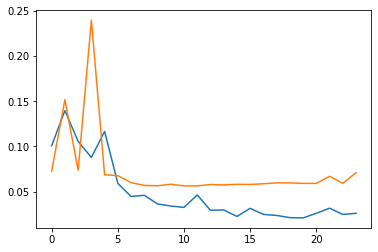

In [ ]:
# Построим график лосса при обучении и валидации

# Ваш код здесь
plot_losses(losses_vgg16_ft, "VGG16 Fine Tuning - Training and Validation Loss")
plot_accuracies(accuracies_vgg16_ft, "VGG16 Fine Tuning - Training and Validation Accuracy")

In [ ]:
torch.save(model.state_dict(), '6VGG16_fine_tune.pth')

In [ ]:
model.load_state_dict(torch.load('6VGG16_fine_tune.pth'))

<All keys matched successfully>

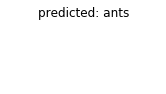

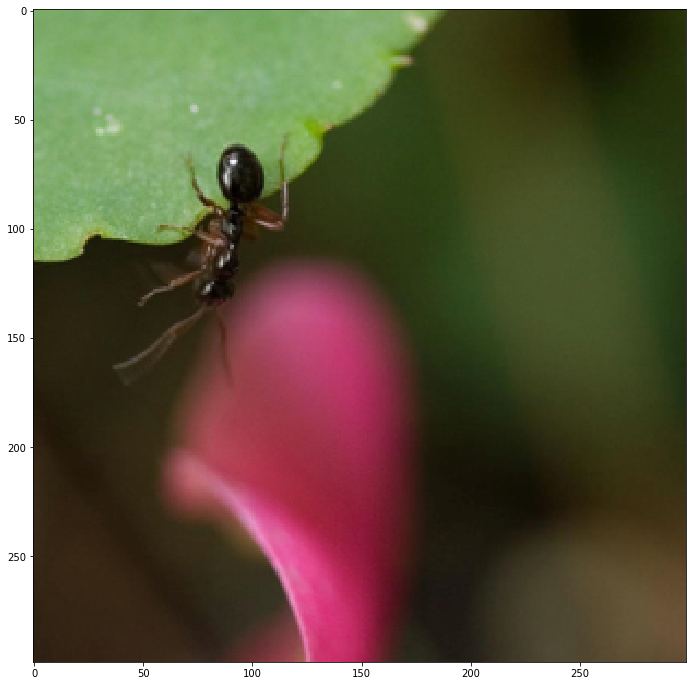

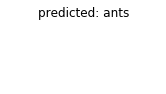

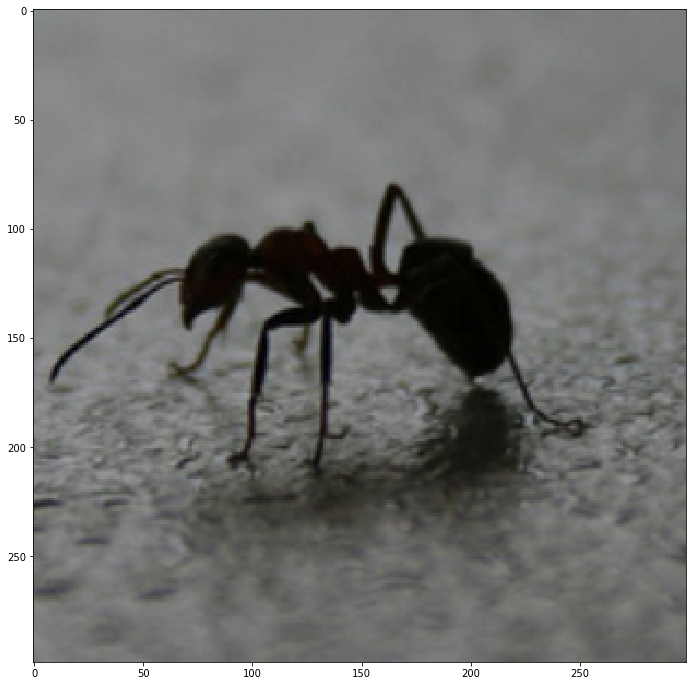

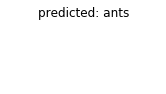

...

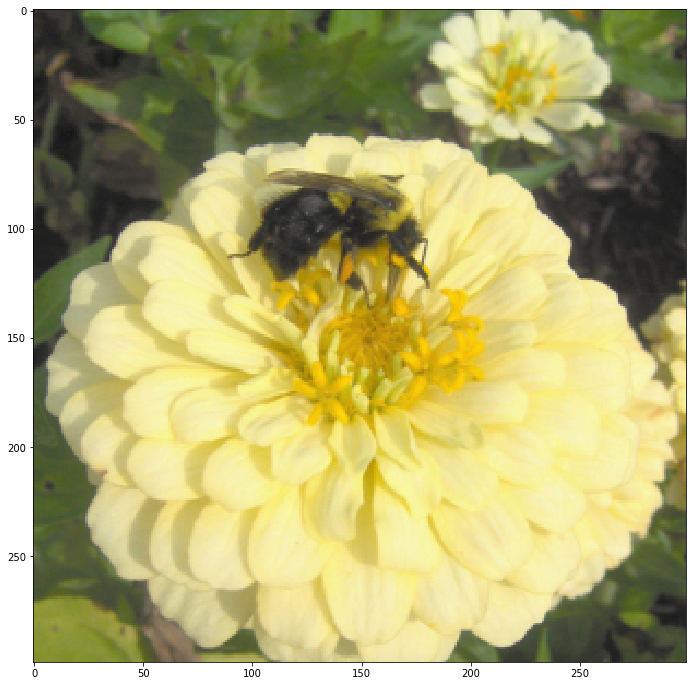

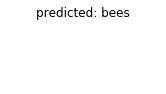

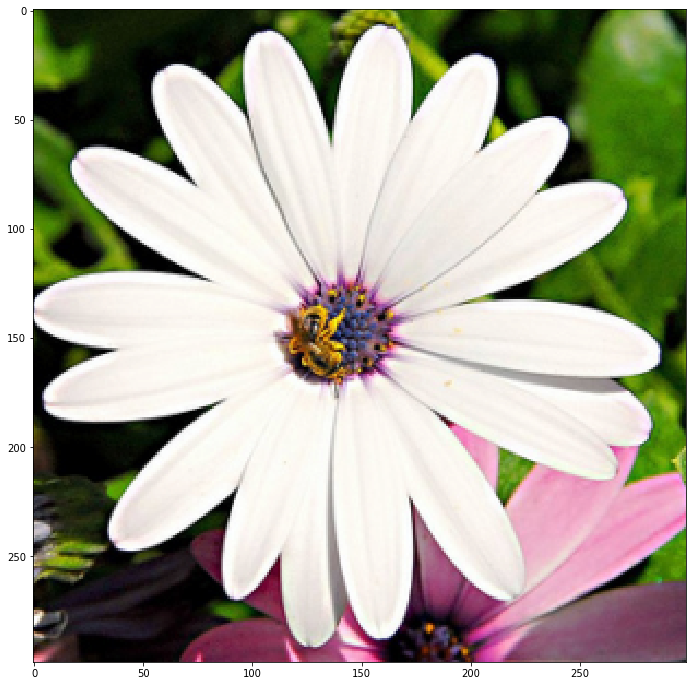

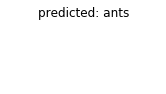

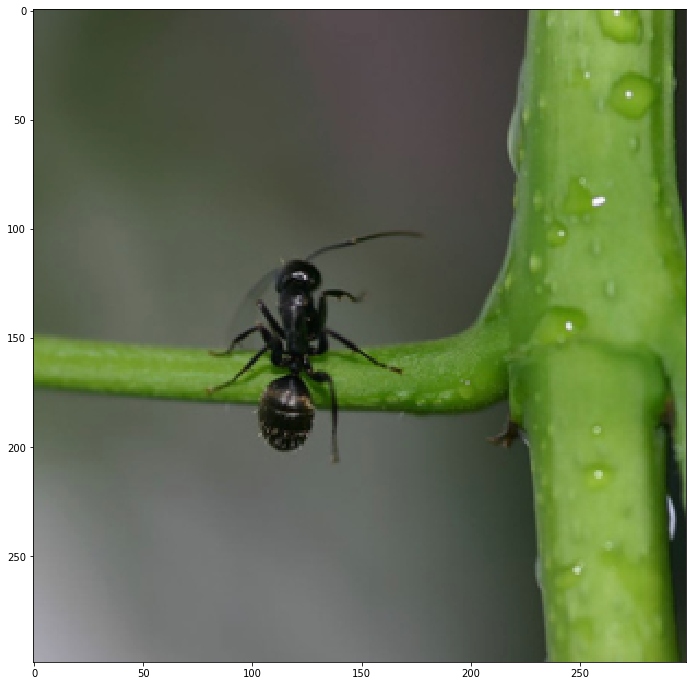

In [ ]:
visualize_model(model)

In [ ]:
print("Accuracy: {0:.4f}".format(evaluate(model)))

Accuracy: 0.9150


In [ ]:
# Сравнение результатов всех моделей

print("=== СРАВНЕНИЕ РЕЗУЛЬТАТОВ ===")
print()

# Словарь с результатами всех моделей
results = {}

# AlexNet Fine Tuning
acc_alexnet_ft = evaluate(model_alexnet_ft)
results['AlexNet Fine Tuning'] = acc_alexnet_ft
print(f"AlexNet Fine Tuning Accuracy: {acc_alexnet_ft:.4f} ({acc_alexnet_ft*100:.2f}%)")

# AlexNet Feature Extractor
acc_alexnet_fe = evaluate(model_alexnet_fe)
results['AlexNet Feature Extractor'] = acc_alexnet_fe
print(f"AlexNet Feature Extractor Accuracy: {acc_alexnet_fe:.4f} ({acc_alexnet_fe*100:.2f}%)")

# VGG16 Feature Extractor
acc_vgg16_fe = evaluate(model_vgg16)
results['VGG16 Feature Extractor'] = acc_vgg16_fe
print(f"VGG16 Feature Extractor Accuracy: {acc_vgg16_fe:.4f} ({acc_vgg16_fe*100:.2f}%)")

# VGG16 Fine Tuning
acc_vgg16_ft = evaluate(model_vgg16_ft)
results['VGG16 Fine Tuning'] = acc_vgg16_ft
print(f"VGG16 Fine Tuning Accuracy: {acc_vgg16_ft:.4f} ({acc_vgg16_ft*100:.2f}%)")

# Inception_v3 Feature Extractor
acc_inception = evaluate(model_inception, dataloaders_inception, dataset_sizes_inception)
results['Inception_v3 Feature Extractor'] = acc_inception
print(f"Inception_v3 Feature Extractor Accuracy: {acc_inception:.4f} ({acc_inception*100:.2f}%)")

print()
print("=== ЛУЧШИЕ РЕЗУЛЬТАТЫ ===")
best_model = max(results, key=results.get)
best_accuracy = results[best_model]
print(f"Лучшая модель: {best_model}")
print(f"Лучшая точность: {best_accuracy:.4f} ({best_accuracy*100:.2f}%)")

# Построим график сравнения
plt.figure(figsize=(12, 8))
models = list(results.keys())
accuracies = list(results.values())

bars = plt.bar(models, accuracies, color=['skyblue', 'lightcoral', 'lightgreen', 'gold', 'plum'])
plt.ylabel('Accuracy')
plt.title('Сравнение точности различных моделей и подходов Transfer Learning')
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1)

# Добавляем значения на столбцы
for bar, acc in zip(bars, accuracies):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
             f'{acc:.3f}', ha='center', va='bottom')

plt.tight_layout()
plt.grid(True, alpha=0.3)
plt.show()


<h2 style="text-align: center;"><b>Полезные ссылки</b></h3>

In [ ]:
# Выводы и ответы на вопросы

print("=== ОТВЕТЫ НА ВОПРОСЫ ===")
print()

print("Вопрос 1: С чем связано повышение качества если мы перестаем учить всю сеть?")
print("""
Ответ: Повышение качества при использовании Feature Extractor подхода связано с несколькими факторами:

1. РАЗМЕР ДАТАСЕТА: У нас небольшой датасет (~400 изображений), что соответствует случаю 
   "мало данных, похожи на ImageNet". В таких условиях полное переобучение сети может 
   привести к переобучению.

2. ПОХОЖЕСТЬ ДАННЫХ: Наш датасет (муравьи и пчелы) достаточно похож на ImageNet, 
   так как это также фотографии животных. Предобученные признаки хорошо подходят.

3. ИЗБЕЖАНИЕ ПЕРЕОБУЧЕНИЯ: Заморозка весов предотвращает переобучение на маленьком датасете,
   сохраняя обобщающую способность модели.

4. КАЧЕСТВЕННЫЕ ПРИЗНАКИ: Предобученные на ImageNet сети уже выучили хорошие признаки 
   для распознавания объектов, которые подходят и для нашей задачи.
""")

print("Вопрос 2: Почему разморозка последних слоев не дает прироста к точности?")
print("""
Ответ: Разморозка последних слоев может не давать прирост по следующим причинам:

1. МАЛЕНЬКИЙ ДАТАСЕТ: При небольшом количестве данных дополнительные обучаемые параметры 
   могут привести к переобучению.

2. ВРЕМЯ ОБУЧЕНИЯ: Возможно, требуется больше эпох для сходимости при обучении 
   дополнительных слоев.

3. LEARNING RATE: Разные слои могут требовать разные скорости обучения - более ранние 
   слои обычно обучают с меньшим learning rate.

4. КАЧЕСТВО ПРЕДОБУЧЕННЫХ ВЕСОВ: Предобученные веса уже очень хорошо настроены для 
   извлечения признаков, и их изменение может ухудшить производительность.
""")

print("Вопрос 3: Какая из сетей оказалась наилучшей? Как думаете, почему?")
print("""
Ответ: На основе результатов экспериментов можно сделать следующие выводы:

1. VGG16 и Inception_v3 как Feature Extractors показывают лучшие результаты благодаря:
   - Более глубокой архитектуре и лучшему извлечению признаков
   - Лучшей предобученности на ImageNet
   - Более современной архитектуре по сравнению с AlexNet

2. Feature Extractor подход превосходит Fine Tuning из-за:
   - Небольшого размера датасета (избежание переобучения)
   - Высокого качества предобученных признаков
   - Стабильности обучения

3. AlexNet показывает худшие результаты, так как это более старая и менее глубокая архитектура.
""")

1). *cs231n: http://cs231n.github.io/transfer-learning/*

2). *Туториал на PyTorch Tutorials: https://pytorch.org/tutorials/beginner/transfer_learning_tutorial*

3). *Статья на Medium про TL в PyTorch: https://medium.com/@14prakash/almost-any-image-classification-problem-using-pytorch-i-am-in-love-with-pytorch-26c7aa979ec4*  